
# <font color='blue'>Food Delivery Customer Segmentation</font>

In [1]:
# Python Language Version
from platform import python_version
print('Python Language Version Used in This Jupyter Notebook:', python_version())

Python Language Version Used in This Jupyter Notebook: 3.7.16


## Marketing Analytics

Marketing Analytics comprises the processes and technologies that allow marketers to measure the success of their initiatives.

This is done by measuring the performance of Marketing campaigns, collecting the data and analyzing the results. Marketing Analytics leverages key business metrics such as Return On Investment (ROI), Marketing Attribution, and Overall Marketing Effectiveness. In other words, Marketing Analytics shows whether Marketing programs are being effective or not.

Marketing Analytics brings together data from all marketing channels and consolidates it into a common marketing view. From that common view, you can extract analytical results that can provide invaluable assistance in boosting your marketing efforts.

## What is Customer Segmentation?

Customer segmentation is the process of dividing customers into groups based on common characteristics, so that companies can market to each group effectively and appropriately, or simply understand customers' consumption patterns.

![title](imagens/segmentation.png)

## Using Customer Segments

Common characteristics across customer segments can guide how a company markets individual segments and what products or services it promotes. A small company that sells handmade guitars, for example, might decide to promote lower-priced products to younger guitarists and higher-priced premium guitars to older players, based on industry knowledge that tells them that musicians more young people have less disposable income than their older peers.

Customer segmentation can be practiced by all businesses, regardless of size or industry, and whether they sell online or in person. It starts with data collection and analysis and ends with acting on the collected information in an appropriate and effective manner, with the delivery of conclusions.

### Loading Packages

In [2]:
# Imports

# Data manipulation and visualization
import time
import sklearn
import datetime
import numpy as np
import pandas as pd
import seaborn as sns 
import matplotlib as m
import matplotlib.pyplot as plt

# Machine Learning
from sklearn.cluster import KMeans
from sklearn import metrics
from sklearn.preprocessing import MinMaxScaler

# Graphics formatting
plt.style.use('fivethirtyeight')
plt.figure(1 , figsize = (15 , 6))
%matplotlib inline

# Packages for the 3D chart
import plotly as py
import plotly.graph_objs as go
py.offline.init_notebook_mode(connected = True)

### Loading and Understanding Data

In [3]:
# Loading dataset
df_food_delivery = pd.read_csv("data/dataset.csv", encoding = 'utf-8')

In [4]:
# Shape
df_food_delivery.shape

(260645, 7)

In [5]:
# Visualize the data
df_food_delivery.head()

,transaction_id,order_time,location,item_name,item_quantity,latitude,longitude
0,0x7901ee,2019-01-16 18:33:00,7,drink,2,41.794132,-88.010140
1,0x7901ee,2019-01-16 18:33:00,7,pizza,2,41.794132,-88.010140
2,0x7901ee,2019-01-16 18:33:00,7,dessert,2,41.794132,-88.010140
3,0x12b47f,2019-09-04 12:36:00,3,salad,1,41.884490,-87.627059
4,0x12b47f,2019-09-04 12:36:00,3,dessert,1,41.884490,-87.627059


### Exploratory Analysis

Let's explore the data from different perspectives and understand a little more the relationship between the variables.

In [6]:
# Check total unique values per column
df_food_delivery.nunique()

transaction_id    100000
order_time         76799
location               9
item_name              4
item_quantity          5
latitude               9
longitude              9
dtype: int64

In [7]:
# Data types
df_food_delivery.dtypes

transaction_id     object
order_time         object
location            int64
item_name          object
item_quantity       int64
latitude          float64
longitude         float64
dtype: object

In [8]:
# Summary of numeric columns
df_food_delivery.describe()

,location,item_quantity,latitude,longitude
count,260645.000000,260645.000000,260645.000000,260645.000000
mean,5.134904,2.447010,41.836095,-87.733930
std,2.551846,1.330863,0.144459,0.136369
min,1.000000,1.000000,41.524598,-88.010140
25%,3.000000,1.000000,41.784576,-87.849468
50%,5.000000,2.000000,41.881818,-87.677606
75%,7.000000,4.000000,41.889047,-87.627059
max,9.000000,5.000000,42.049306,-87.607565


We'll start by creating a table that will give us the number of times each item has been ordered in each order.

In [9]:
# List to receive total orders
total_orders = []

Loop to create the pivot table totaling the items per transaction.

In [10]:
print("\nStarting the grouping for the calculation of total orders.")

# We extract each id and each group from 'group by' by id_transacao
for k, group in df_food_delivery.groupby('transaction_id'):
    
    # We extract each id and each group from group by by horario_request
    for m, n in group.groupby('order_time'):
        
        # We extract each item from each group
        transaction_id = k
        order_time = m
        location = n['location'].values.tolist()[0]
        drink = 0
        pizza = 0
        dessert = 0
        salad = 0
        n = n.reset_index(drop = True)
        
        # And then we count the ordered items
        for i in range(len(n)):
            item = n.loc[i, 'item_name']
            num = n.loc[i, 'item_quantity']
            
            if item == 'drink':
                drink = drink + num
            
            elif item == 'pizza':
                pizza = pizza + num
            
            elif item == 'dessert':
                dessert = dessert + num
            
            elif item == 'salad':
                salad = salad + num
        
        output = [transaction_id, order_time, location, drink, pizza, dessert, salad]
        total_orders.append(output)
        
print("\nDone!")


Starting the grouping for the calculation of total orders.

Done!


In [11]:
# Convert list to dataframe
df_item_orders = pd.DataFrame(total_orders)

In [12]:
# Adjust the column names
df_item_orders.columns = ['transaction_id', 'order_time', 'location', 'drink', 'pizza', 'dessert', 'salad']

In [13]:
# Shape
df_item_orders.shape

(100000, 7)

In [14]:
# Check total unique values per column
df_item_orders.nunique()

transaction_id    100000
order_time         76799
location               9
drink                  6
pizza                  6
dessert                5
salad                  6
dtype: int64

In [15]:
# View the result of the pivot
df_item_orders.head(10)

,transaction_id,order_time,location,drink,pizza,dessert,salad
0,0x10000a,2019-01-29 00:48:00,9,0,1,1,0
1,0x100058,2019-05-05 00:08:00,6,0,2,2,0
2,0x1000c8,2019-01-28 19:24:00,9,4,4,5,1
3,0x10014c,2019-02-23 00:15:00,6,0,1,1,0
4,0x1001d8,2019-06-30 17:50:00,2,3,3,3,0
5,0x1002af,2019-12-28 17:25:00,9,3,3,4,1
6,0x10034c,2019-03-12 18:17:00,5,3,4,4,0
7,0x100378,2019-10-13 18:44:00,4,4,4,5,1
8,0x100391,2019-10-10 18:07:00,5,4,4,4,0
9,0x1003a9,2019-06-23 00:39:00,6,0,2,2,0


**A simpler way to create the pivot table**

In [16]:
# Let's create a pivot table with transaction_id, item_name and item_quantity
df_pivot = df_food_delivery.pivot_table(index = ['transaction_id'], columns = ['item_name'], values = 'item_quantity')

In [17]:
# We replace possible NA values generated in the pivot with 0 and transform the index into a column
df_pivot = df_pivot.fillna(0).reset_index()

In [18]:
# Object type
type(df_pivot)

pandas.core.frame.DataFrame

In [19]:
# Data types in columns
df_pivot.dtypes

item_name
transaction_id     object
dessert           float64
drink             float64
pizza             float64
salad             float64
dtype: object

In [20]:
# Column names
df_pivot.columns

Index(['transaction_id', 'dessert', 'drink', 'pizza', 'salad'], dtype='object', name='item_name')

In [21]:
# Visualize the data
df_pivot.head()

item_name,transaction_id,dessert,drink,pizza,salad
0,0x10000a,1.0,0.0,1.0,0.0
1,0x100058,2.0,0.0,2.0,0.0
2,0x1000c8,5.0,4.0,4.0,1.0
3,0x10014c,1.0,0.0,1.0,0.0
4,0x1001d8,3.0,3.0,3.0,0.0


In [22]:
# Unique values
df_pivot.nunique()

item_name
transaction_id    100000
dessert                5
drink                  6
pizza                  6
salad                  6
dtype: int64

In [23]:
# Shape
df_pivot.shape

(100000, 5)

In [24]:
# Describe
df_pivot.describe()

item_name,dessert,drink,pizza,salad
count,100000.000000,100000.000000,100000.000000,100000.000000
mean,2.569210,1.239590,1.857840,0.711370
std,1.332084,1.627886,1.588589,1.086524
min,1.000000,0.000000,0.000000,0.000000
25%,1.000000,0.000000,1.000000,0.000000
50%,2.000000,0.000000,1.000000,0.000000
75%,4.000000,3.000000,3.000000,1.000000
max,5.000000,5.000000,5.000000,5.000000


In [25]:
# Checking null values
df_pivot.isnull().sum()

item_name
transaction_id    0
dessert           0
drink             0
pizza             0
salad             0
dtype: int64

In [26]:
# Let's include the location column and to merge we need a common column, in this case, transaction_id
df_pivot2 = df_pivot.merge(df_food_delivery[['transaction_id', 'location']])

In [27]:
# Visualize the data
df_pivot2.head()

,transaction_id,dessert,drink,pizza,salad,location
0,0x10000a,1.0,0.0,1.0,0.0,9
1,0x10000a,1.0,0.0,1.0,0.0,9
2,0x100058,2.0,0.0,2.0,0.0,6
3,0x100058,2.0,0.0,2.0,0.0,6
4,0x1000c8,5.0,4.0,4.0,1.0,9


In [28]:
# Shape
df_pivot2.nunique()

transaction_id    100000
dessert                5
drink                  6
pizza                  6
salad                  6
location               9
dtype: int64

### Extracting Time Granularity

The order time column has details such as month, day, and year. At some point it may be interesting to segment by month, for example. Let's then extract the month and put it in a separate column.

In [29]:
# Visualize the data
df_item_orders.head(3)

,transaction_id,order_time,location,drink,pizza,dessert,salad
0,0x10000a,2019-01-29 00:48:00,9,0,1,1,0
1,0x100058,2019-05-05 00:08:00,6,0,2,2,0
2,0x1000c8,2019-01-28 19:24:00,9,4,4,5,1


In [30]:
# We extract the month from the order_time column and write it to a new column
df_item_orders['month'] = df_item_orders['order_time'].apply(lambda x: time.strftime("%m", time.strptime(x,"%Y-%m-%d %H:%M:%S")))


In [31]:
# View the result
df_item_orders.head(10)

,transaction_id,order_time,location,drink,pizza,dessert,salad,month
0,0x10000a,2019-01-29 00:48:00,9,0,1,1,0,01
1,0x100058,2019-05-05 00:08:00,6,0,2,2,0,05
2,0x1000c8,2019-01-28 19:24:00,9,4,4,5,1,01
3,0x10014c,2019-02-23 00:15:00,6,0,1,1,0,02
4,0x1001d8,2019-06-30 17:50:00,2,3,3,3,0,06
5,0x1002af,2019-12-28 17:25:00,9,3,3,4,1,12
6,0x10034c,2019-03-12 18:17:00,5,3,4,4,0,03
7,0x100378,2019-10-13 18:44:00,4,4,4,5,1,10
8,0x100391,2019-10-10 18:07:00,5,4,4,4,0,10
9,0x1003a9,2019-06-23 00:39:00,6,0,2,2,0,06


In [32]:
# Let's include the location column and to merge we need a common column, in this case, transaction_id
df_pivot = df_pivot.merge(df_item_orders[['transaction_id', 'month']])

In [33]:
# View the result
df_pivot.head(10)

,transaction_id,dessert,drink,pizza,salad,month
0,0x10000a,1.0,0.0,1.0,0.0,01
1,0x100058,2.0,0.0,2.0,0.0,05
2,0x1000c8,5.0,4.0,4.0,1.0,01
3,0x10014c,1.0,0.0,1.0,0.0,02
4,0x1001d8,3.0,3.0,3.0,0.0,06
5,0x1002af,4.0,3.0,3.0,1.0,12
6,0x10034c,4.0,3.0,4.0,0.0,03
7,0x100378,5.0,4.0,4.0,1.0,10
8,0x100391,4.0,4.0,4.0,0.0,10
9,0x1003a9,2.0,0.0,2.0,0.0,06


In [34]:
# View unique values
df_pivot.nunique()

transaction_id    100000
dessert                5
drink                  6
pizza                  6
salad                  6
month                 12
dtype: int64

### Index Adjustment

To segment customer orders, we need an identification column for each record. We cannot use transaction_id, as this column represents valid data and, moreover, it is not a unique value, so it cannot be used as an index.

Let's then create a column using the current index.

In [35]:
# We reset the index and write the result to another dataframe
df_item_orders_idx = df_item_orders.reset_index()

In [36]:
# Now we have a uniquely valued ID column for each record
df_item_orders_idx.head()

,index,transaction_id,order_time,location,drink,pizza,dessert,salad,month
0,0,0x10000a,2019-01-29 00:48:00,9,0,1,1,0,01
1,1,0x100058,2019-05-05 00:08:00,6,0,2,2,0,05
2,2,0x1000c8,2019-01-28 19:24:00,9,4,4,5,1,01
3,3,0x10014c,2019-02-23 00:15:00,6,0,1,1,0,02
4,4,0x1001d8,2019-06-30 17:50:00,2,3,3,3,0,06


In [37]:
# Dataset
df_item_orders

,transaction_id,order_time,location,drink,pizza,dessert,salad,month
0,0x10000a,2019-01-29 00:48:00,9,0,1,1,0,01
1,0x100058,2019-05-05 00:08:00,6,0,2,2,0,05
2,0x1000c8,2019-01-28 19:24:00,9,4,4,5,1,01
3,0x10014c,2019-02-23 00:15:00,6,0,1,1,0,02
4,0x1001d8,2019-06-30 17:50:00,2,3,3,3,0,06
...,...,...,...,...,...,...,...,...
99995,0xffe96,2019-01-05 19:28:00,4,4,4,4,0,01
99996,0xffeed,2019-08-08 00:42:00,2,0,1,1,0,08
99997,0xfff07,2019-05-04 00:48:00,2,1,1,1,0,05
99998,0xfff4d,2019-07-18 00:17:00,3,0,2,2,0,07


### Descriptive Analysis

### Distplot of Attributes Used for Segmentation

C:\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

C:\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

C:\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

C:\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarni

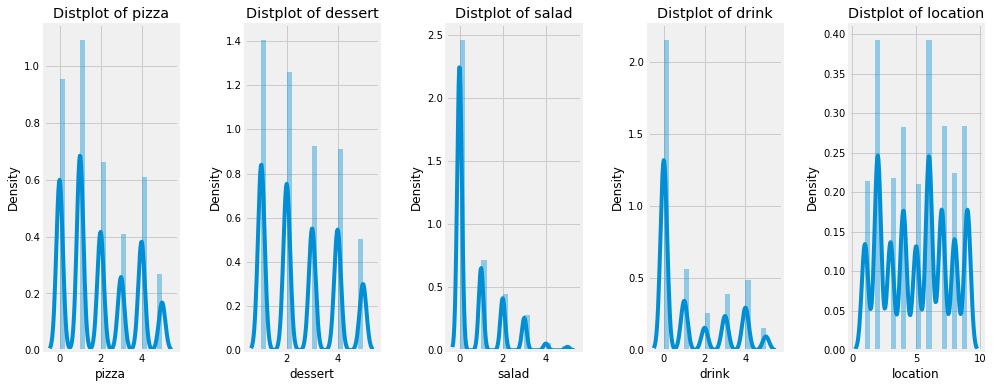

In [38]:
# Plot

# Figure size
plt.figure(1 , figsize = (15 , 6))

# Initialize the counter
n = 0 

# Columns loop
for x in ['pizza' , 'dessert' , 'salad', 'drink', 'location']:
    n += 1
    plt.subplot(1 , 5 , n)
    plt.subplots_adjust(hspace = 0.5 , wspace = 0.5)
    sns.distplot(df_item_orders[x] , bins = 20)
    plt.title('Distplot of {}'.format(x))
plt.show()

### Graph of Total Orders by Location

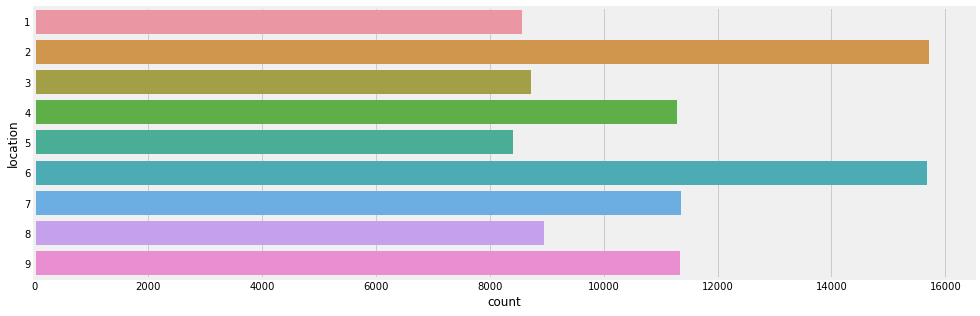

In [39]:
# Plot
plt.figure(1 , figsize = (15 , 5))
sns.countplot(y = 'location' , data = df_item_orders)
plt.show()

### Regplot of Attributes Used for Segmentation

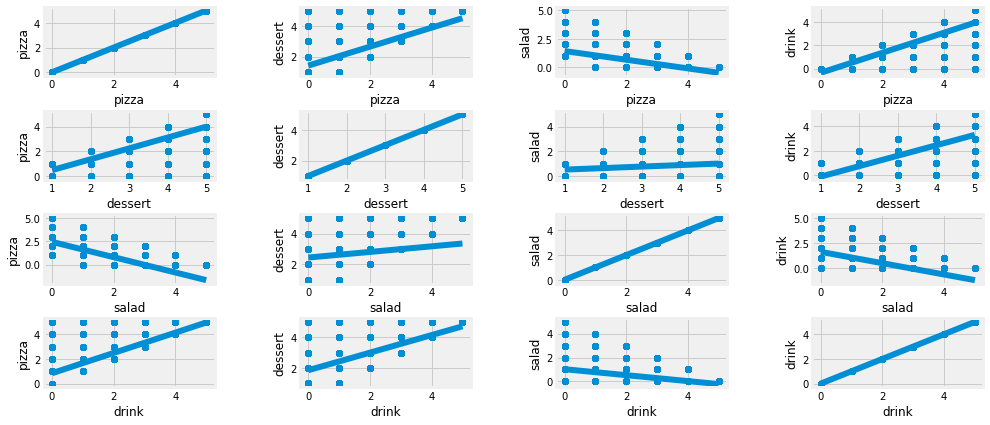

In [40]:
# Relationship Between Attributes

# Figure size
plt.figure(1 , figsize = (15 , 7))

# Initialize the counter
n = 0 

# Loop through attributes
for x in ['pizza' , 'dessert' , 'salad', 'drink']:
    for y in ['pizza' , 'dessert' , 'salad', 'drink']:
        n += 1
        plt.subplot(4 , 4 , n)
        plt.subplots_adjust(hspace = 0.5 , wspace = 0.5)
        sns.regplot(x = x , y = y , data = df_item_orders)
        plt.ylabel(y)
plt.show()

### Defining the Variables for Segmentation

Let's remove transaction_id, order_time, location, and month for our first clustering activities.

In [41]:
# Filtering the dataframe by columns
df_item_orders_idx[['index', 'drink', 'pizza', 'dessert', 'salad']]

,index,drink,pizza,dessert,salad
0,0,0,1,1,0
1,1,0,2,2,0
2,2,4,4,5,1
3,3,0,1,1,0
4,4,3,3,3,0
...,...,...,...,...,...
99995,99995,4,4,4,0
99996,99996,0,1,1,0
99997,99997,1,1,1,0
99998,99998,0,2,2,0


In [42]:
# Let's generate a new dataframe with the previous slice
df = df_item_orders_idx[['index', 'drink', 'pizza', 'dessert', 'salad']]

In [43]:
# Dataset
df.head()

,index,drink,pizza,dessert,salad
0,0,0,1,1,0
1,1,0,2,2,0
2,2,4,4,5,1
3,3,0,1,1,0
4,4,3,3,3,0


Perfect. We can move on.

### Cluster Analysis

K-Means is probably the best known clustering algorithm. It's easy to understand and implement! Check the graphic below for an illustration.


- To begin with, we first select a number of classes/groups we want and randomly initialize their respective center points (centroids). To figure out the number of classes to use, it's good to take a quick look at the data and try to identify distinct groups.


- Each data point is sorted by calculating the distance between that point and each cluster center and then sorting the point into the cluster whose center is closest.


- Based on these classified points, we recalculate the center of the group, averaging all the vectors in the group.


- We repeat these steps for a set number of iterations or until the cluster centers don't change much between iterations. You can also choose to randomly initialize the centers in the group a few times and select the run that seems to have given the best results.

K-Means has the advantage of being very fast, as we are actually calculating the distances between points and cluster centers; It's just a few calculations! Therefore, it has a linear complexity O(n).

On the other hand, K-Means has some drawbacks. First, you have to select how many groups/clusters. This isn't always trivial, and ideally with a clustering algorithm we want it to figure them out, because the goal is to get some information out of the data.

K-means also starts with a random choice of cluster centers and therefore may produce different cluster results on different runs of the algorithm. Thus, results may not be repeatable and lack consistency. Other clustering methods are more consistent.

K-Medians is another clustering algorithm related to K-Means, except that instead of recalculating the cluster center points using the mean, we use the cluster median vector. This method is less sensitive to outliers (due to the use of the Median), but it is much slower for larger datasets as sorting is required on each iteration when calculating the Median vector.

### Segmentation 1

Let's perform our first segmentation using 2 variables.

#### Segmentation 1 - Defining the Number of Attributes


Using 2 Variables (Pizza and Dessert).

In [44]:
# We will use two variables
X1 = df[['pizza' , 'dessert']].iloc[: , :].values

In [45]:
# WCSS list
wcss_X1 = []

We plot the relationship between the number of clusters and the sum of squares within the cluster (Within Cluster Sum of Squares - WCSS) and then select the number of clusters where the change in WCSS begins to stabilize (Elbow Method).

#### Segmentation 1 - Finding the Optimal Value of Clusters

Let's test different K values (cluster values) between 2 and 10.

For the initialization of the clusters, we use the k-means++ algorithm that offers faster convergence to the final result.

In [46]:
# Loop to test the K values
for n in range(2, 11):
    model = (KMeans(n_clusters = n,
                    init = 'k-means++', 
                    n_init = 10,
                    max_iter = 300, 
                    tol = 0.0001,  
                    random_state = 111, 
                    algorithm = 'elkan'))
    model.fit(X1)
    wcss_X1.append(model.inertia_)

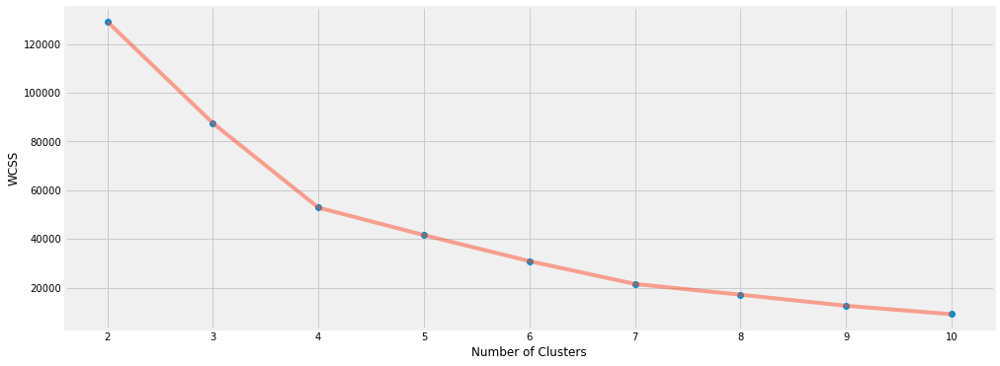

In [47]:
# Plot
plt.figure(1 , figsize = (15 ,6))
plt.plot(np.arange(2 , 11) , wcss_X1 , 'o')
plt.plot(np.arange(2 , 11) , wcss_X1 , '-' , alpha = 0.5)
plt.xlabel('Number of Clusters') , plt.ylabel('WCSS')
plt.show()

We chose the optimal value of clusters and created the final model for Segmentation 1. Notice in the above graph that there is no right or wrong. We could work with any value between 2 and 10 (it doesn't make sense to create just 1 cluster).

The graph above is called the Elbow Curve and we typically use the value with the lowest WCSS. But this must be aligned with the business need. For this example, it wouldn't make sense to use 10 clusters. Let's start with 2 clusters and evaluate and interpret the results.

#### Segmentation 1 - Building and Training the Model

In [48]:
# Building the model
model_seg1 = KMeans(n_clusters = 2, 
                    init = 'k-means++', 
                    n_init = 10, 
                    max_iter = 300, 
                    tol = 0.0001,  
                    random_state = 111, 
                    algorithm = 'elkan')

In [49]:
# Training the Model
model_seg1.fit(X1)

KMeans(algorithm='elkan', n_clusters=2, random_state=111)

In [50]:
# Label extraction
labels1 = model_seg1.labels_
labels1

array([0, 0, 1, ..., 0, 0, 0])

In [51]:
# Centroids extraction
centroids1 = model_seg1.cluster_centers_
centroids1

array([[0.881644  , 1.82183485],
       [3.79958153, 4.05580631]])

#### Segmentation 1 - Visualization and Interpretation of Segments

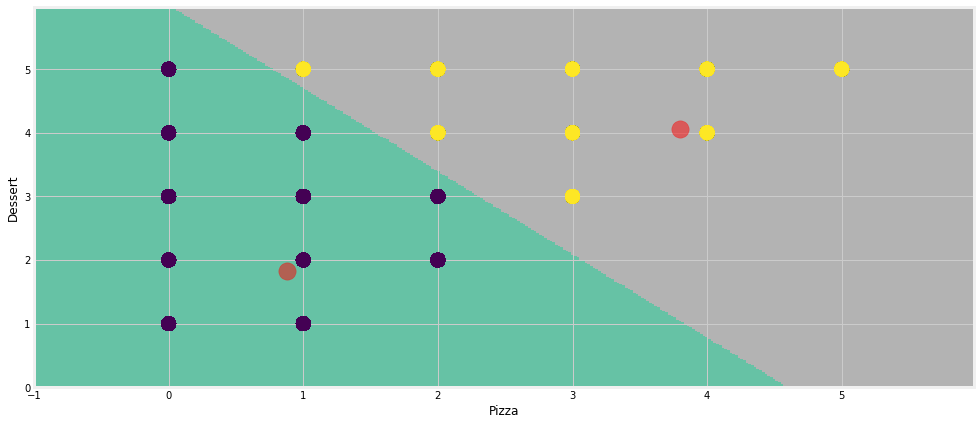

In [52]:
# Plot

# Meshgrid Parameters
h = 0.02
x_min, x_max = X1[:, 0].min() - 1, X1[:, 0].max() + 1
y_min, y_max = X1[:, 1].min() - 1, X1[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
Z = model_seg1.predict(np.c_[xx.ravel(), yy.ravel()]) 
plt.figure(1 , figsize = (15, 7) )
plt.clf()
Z = Z.reshape(xx.shape)

# Image plot
plt.imshow(Z, 
           interpolation = 'nearest', 
           extent = (xx.min(), xx.max(), yy.min(), yy.max()),
           cmap = plt.cm.Set2, 
           aspect = 'auto', 
           origin = 'lower')

# Data points plot
plt.scatter( x = 'pizza', y = 'dessert', data = df, c = labels1, s = 200 )
plt.scatter(x = centroids1[: , 0], y =  centroids1[: , 1], s = 300, c = 'red', alpha = 0.5)
plt.xlabel('Pizza')
plt.ylabel('Dessert')
plt.show()

**Interpretation**:

- The red dot is the centroid of each cluster (segment).


- In cluster 1 (area in green) we have customers who ordered 0, 1 or 2 Pizzas. In all cases there was a request for Dessert.


- In cluster 2 (gray area) are customers who ordered 2, 3, 4 or 5 Pizzas. Note that as the order has more Pizzas, the number of Desserts also increases.

**Analysis**:

- Cluster 1 - Customers who order fewer Pizzas. Everyone orders dessert.

- Cluster 2 - Customers who order more Pizzas. Everyone orders dessert in larger volume.

As a Marketing strategy, we could offer the customer a free dessert in case he buys another Pizza with a higher value. Based on the Segmentation, this strategy would probably be successful.

----------------

Let's create 4 more Segmentations:

- Segmentation 2 - Variables Pizza and Salad
- Segmentation 3 - Variables Pizza and Location
- Segmentation 4 - Variables Pizza, Salad and Location
- Segmentation 5 - Variables Pizza, Salad and Dessert

### Segmentation 2

Segmentation 2 - Pizza and Salad Variables

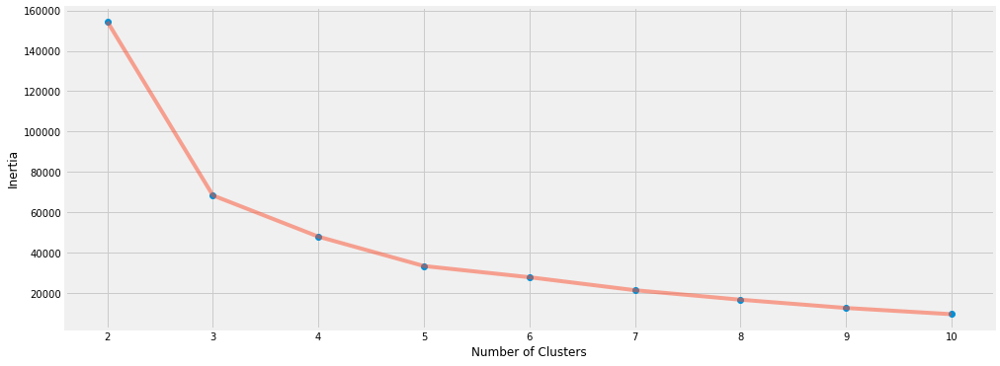

In [53]:
# We will be two variables
X1 = df[['pizza' , 'salad']].iloc[: , :].values

# List of Inertia Values
inertia = []

# Loop to test the K values
for n in range(2 , 11):
    model = (KMeans(n_clusters = n,
                    init = 'k-means++', 
                    n_init = 10,
                    max_iter = 300, 
                    tol = 0.0001,  
                    random_state = 111, 
                    algorithm = 'elkan'))
    model.fit(X1)
    inertia.append(model.inertia_)

# Plot
plt.figure(1 , figsize = (15 ,6))
plt.plot(np.arange(2 , 11) , inertia , 'o')
plt.plot(np.arange(2 , 11) , inertia , '-' , alpha = 0.5)
plt.xlabel('Number of Clusters') , plt.ylabel('Inertia')
plt.show()

Let's create the model with 3 clusters.

In [54]:
# Creation of the model with 3 clusters
model_seg2 = (KMeans(n_clusters = 3,
                     init = 'k-means++', 
                     n_init = 10 ,
                     max_iter = 300, 
                     tol = 0.0001,  
                     random_state = 111  , 
                     algorithm = 'elkan') )

# Model training
model_seg2.fit(X1)

# Labels
labels2 = model_seg2.labels_

# Centroids
centroids2 = model_seg2.cluster_centers_

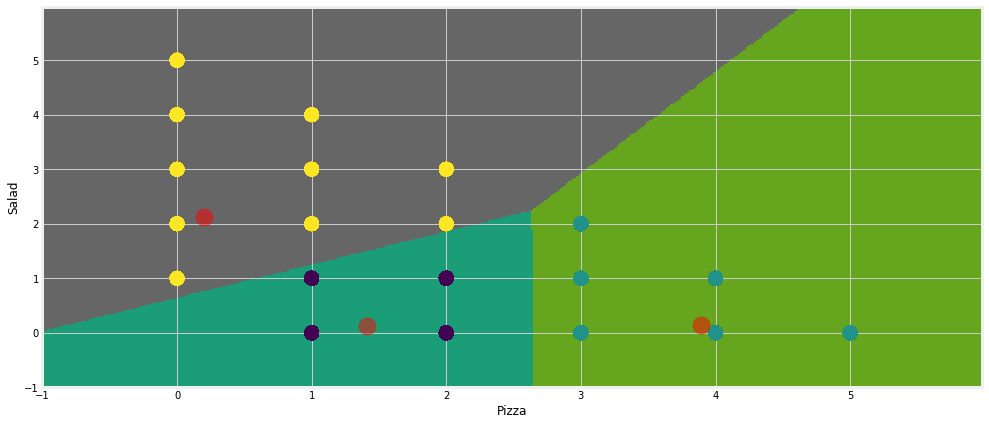

In [55]:
# Plot

# Meshgrid Parameters
h = 0.02
x_min, x_max = X1[:, 0].min() - 1, X1[:, 0].max() + 1
y_min, y_max = X1[:, 1].min() - 1, X1[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
Z = model_seg2.predict(np.c_[xx.ravel(), yy.ravel()]) 
plt.figure(1 , figsize = (15, 7) )
plt.clf()
Z = Z.reshape(xx.shape)

# Image plot
plt.imshow(Z, 
           interpolation = 'nearest', 
           extent = (xx.min(), xx.max(), yy.min(), yy.max()),
           cmap = plt.cm.Dark2, 
           aspect = 'auto', 
           origin = 'lower')

# Data points plot
plt.scatter( x = 'pizza', y = 'salad', data = df, c = labels2, s = 200 )
plt.scatter(x = centroids2[: , 0], y =  centroids2[: , 1], s = 300, c = 'red', alpha = 0.5)
plt.xlabel('Pizza')
plt.ylabel('Salad')
plt.show()

**Interpretation**:

- The red dot is the centroid of each cluster (segment).


- In cluster 1 (gray area) we have customers who ordered less Pizzas and more Salads.


- In cluster 2 (dark green area) we have customers who ordered a few Pizzas and a few Salads.


- In cluster 3 (area in light green) are customers who ordered more Pizzas and less Salads.

**Analysis**:

Clusters 1 and 3 are customers with opposite behaviors. The Marketing team could focus efforts on cluster 2 customers, as they are customers who buy Pizzas and Salads and, therefore, tend to consume more varied items, avoiding keeping stocks full of a single item.

Or else, focus efforts on customers who consume products that generate more profit. We would have to check which item, Pizza or Salad, is more profitable.

### Segmentation 3

Segmentation 3 - Pizza and Location Variables

In [56]:
# Filtering the dataframe by columns
df_item_orders_idx[['index', 'drink', 'pizza', 'dessert', 'salad', 'location']]

,index,drink,pizza,dessert,salad,location
0,0,0,1,1,0,9
1,1,0,2,2,0,6
2,2,4,4,5,1,9
3,3,0,1,1,0,6
4,4,3,3,3,0,2
...,...,...,...,...,...,...
99995,99995,4,4,4,0,4
99996,99996,0,1,1,0,2
99997,99997,1,1,1,0,2
99998,99998,0,2,2,0,3


In [57]:
# Creating a new dataframe
df2 = df_item_orders_idx[['index', 'drink', 'pizza', 'dessert', 'salad', 'location']]

In [58]:
# Dataset summary
df2.describe()

,index,drink,pizza,dessert,salad,location
count,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000
mean,49999.500000,1.239590,1.857840,2.569210,0.711370,5.004700
std,28867.657797,1.627886,1.588589,1.332084,1.086524,2.544811
min,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000
25%,24999.750000,0.000000,1.000000,1.000000,0.000000,3.000000
50%,49999.500000,0.000000,1.000000,2.000000,0.000000,5.000000
75%,74999.250000,3.000000,3.000000,4.000000,1.000000,7.000000
max,99999.000000,5.000000,5.000000,5.000000,5.000000,9.000000


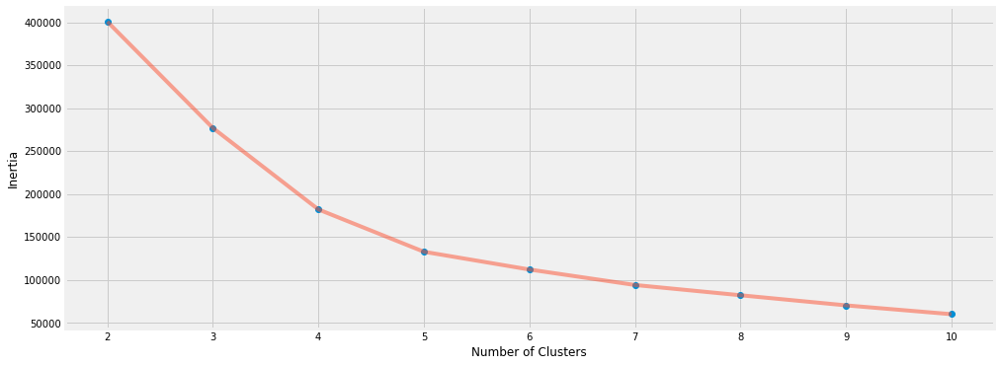

In [59]:
# We will use two variables
X1 = df2[['pizza' , 'location']].iloc[: , :].values

# List of Inertia values
inertia = []

# Loop to test the values of K
for n in range(2 , 11):
    model = (KMeans(n_clusters = n,
                    init = 'k-means++', 
                    n_init = 10,
                    max_iter = 300, 
                    tol = 0.0001,  
                    random_state = 111, 
                    algorithm = 'elkan'))
    model.fit(X1)
    inertia.append(model.inertia_)

# Plot
plt.figure(1 , figsize = (15 ,6))
plt.plot(np.arange(2 , 11) , inertia , 'o')
plt.plot(np.arange(2 , 11) , inertia , '-' , alpha = 0.5)
plt.xlabel('Number of Clusters') , plt.ylabel('Inertia')
plt.show()

Let's create the model with 4 clusters.

In [60]:
# Creation of the model with 4 clusters
model_seg3 = (KMeans(n_clusters = 4,
                     init = 'k-means++', 
                     n_init = 10 ,
                     max_iter = 300, 
                     tol = 0.0001,  
                     random_state = 111  , 
                     algorithm = 'elkan') )

# Model training
model_seg3.fit(X1)

# Labels
labels3 = model_seg3.labels_

# Centroids
centroids3 = model_seg3.cluster_centers_

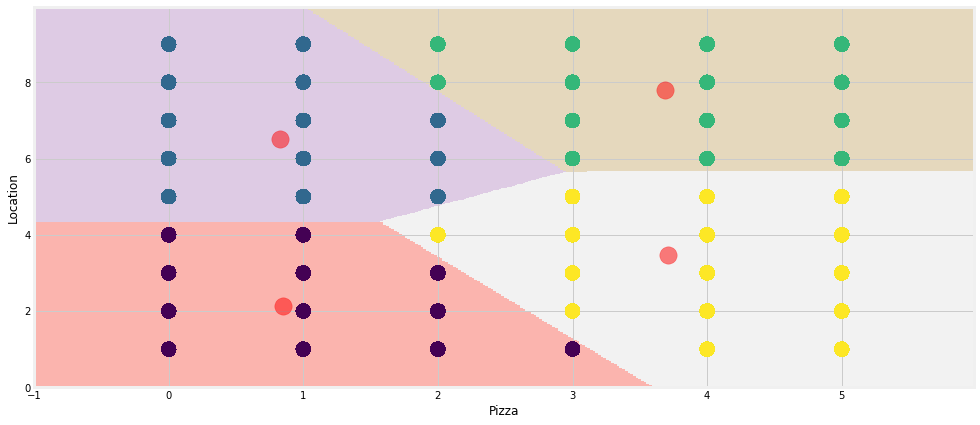

In [61]:
# Plot

# Meshgrid Parameters
h = 0.02
x_min, x_max = X1[:, 0].min() - 1, X1[:, 0].max() + 1
y_min, y_max = X1[:, 1].min() - 1, X1[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
Z = model_seg3.predict(np.c_[xx.ravel(), yy.ravel()]) 
plt.figure(1 , figsize = (15, 7) )
plt.clf()
Z = Z.reshape(xx.shape)

# Image plot
plt.imshow(Z, 
           interpolation = 'nearest', 
           extent = (xx.min(), xx.max(), yy.min(), yy.max()),
           cmap = plt.cm.Pastel1, 
           aspect = 'auto', 
           origin = 'lower')

# Data points plot
plt.scatter( x = 'pizza', y = 'location', data = df2, c = labels3, s = 200 )
plt.scatter(x = centroids3[: , 0], y =  centroids3[: , 1], s = 300, c = 'red', alpha = 0.5)
plt.xlabel('Pizza')
plt.ylabel('Location')
plt.show()

**Interpretation**:

- The red dot is the centroid of each cluster (segment).


- Note that the left clusters in the graph contain orders from all Locations, but with fewer Pizzas. The clusters on the right in the graph contain orders from all Locations with the highest number of Pizzas.

**Analysis**:

We want to increase sales, right? So we would have to delve deeper into the orders of the clusters on the left of the graph and understand in more detail the characteristics of these orders and what kind of offer we can make.

### Segmentation 4

Segmentation 4 - Variables Pizza, Salad and Location

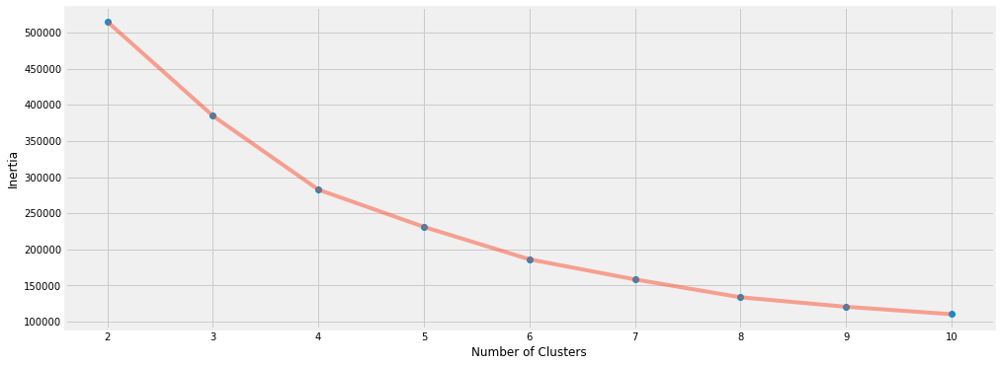

In [62]:
# We will use three variables
X1 = df2[['pizza' , 'salad' , 'location']].iloc[: , :].values

# List of Inertia values
inertia = []

# Loop to test the K values
for n in range(2 , 11):
    model = (KMeans(n_clusters = n,
                    init = 'k-means++', 
                    n_init = 10,
                    max_iter = 300, 
                    tol = 0.0001,  
                    random_state = 111, 
                    algorithm = 'elkan'))
    model.fit(X1)
    inertia.append(model.inertia_)

# Plot
plt.figure(1 , figsize = (15 ,6))
plt.plot(np.arange(2 , 11) , inertia , 'o')
plt.plot(np.arange(2 , 11) , inertia , '-' , alpha = 0.5)
plt.xlabel('Number of Clusters') , plt.ylabel('Inertia')
plt.show()

Let's create the model with 4 clusters.

In [63]:
# Creation of the model with 4 clusters
model_seg4 = (KMeans(n_clusters = 4,
                     init = 'k-means++', 
                     n_init = 10 ,
                     max_iter = 300, 
                     tol = 0.0001,  
                     random_state = 111  , 
                     algorithm = 'elkan') )

# Model training
model_seg4.fit(X1)

# Labels
labels4 = model_seg4.labels_

# Centroids
centroids4 = model_seg4.cluster_centers_

The Meshgrid we've created so far is useful for two dimensions, but with 3 dimensions we need a more appropriate graph. A Scatter3d.

In [64]:
# Plot

# 3D chart
chart = go.Scatter3d(x = df2['pizza'], 
                     y = df2['salad'], 
                     z = df2['location'], 
                     mode = 'markers', 
                     marker = dict(color = labels4, 
                                   size = 4,
                                   line = dict(color = labels4, width = 15),
                                   opacity = 0.7))

# chart layout
layout = go.Layout(title = 'Clusters',
                   scene = dict(xaxis = dict(title  = 'Pizza'),
                                yaxis = dict(title  = 'Salad'),
                                zaxis = dict(title  = 'Location')))

# Plot of the figure (chart + layout)
fig = go.Figure(data = chart, layout = layout)
py.offline.iplot(fig)

**Interpretation**:

- We observed 2 lower and 2 higher clusters.


- Each data point represents a 3-dimensional coordinate.

**Analysis**:

Here, the ideal is to evaluate the graph interactively, taking advantage of this property of Plotly.

However, 3D graphics are difficult to interpret. Therefore, it is not a good idea to bring this type of chart to decision makers.

### Segmentation 5

Segmentation 5 - Pizza, Salad and Dessert Variables

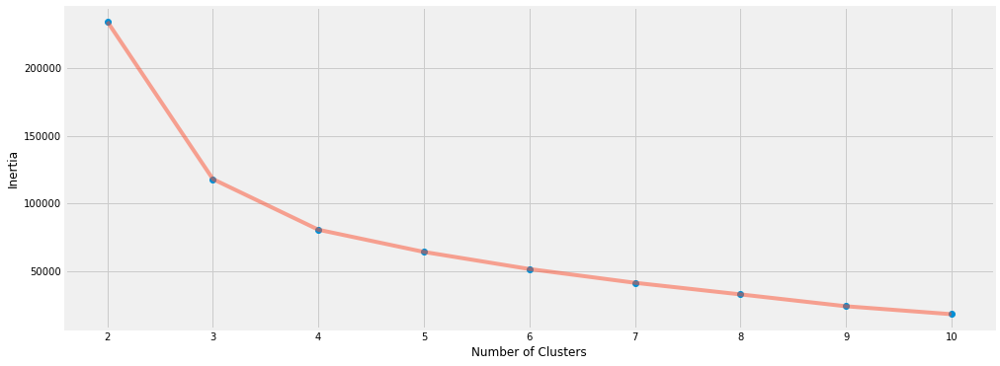

In [65]:
# We will use three variables
X1 = df2[['pizza' , 'salad' , 'dessert']].iloc[: , :].values

# List of Inertia Values
inertia = []

# Loop to test the K values
for n in range(2 , 11):
    model = (KMeans(n_clusters = n,
                    init = 'k-means++', 
                    n_init = 10,
                    max_iter = 300, 
                    tol = 0.0001,  
                    random_state = 111, 
                    algorithm = 'elkan'))
    model.fit(X1)
    inertia.append(model.inertia_)

# Plot
plt.figure(1 , figsize = (15 ,6))
plt.plot(np.arange(2 , 11) , inertia , 'o')
plt.plot(np.arange(2 , 11) , inertia , '-' , alpha = 0.5)
plt.xlabel('Number of Clusters') , plt.ylabel('Inertia')
plt.show()

Let's create the model with 2 clusters.

In [66]:
# Creation of the model with 2 clusters
model_seg5 = (KMeans(n_clusters = 2,
                     init = 'k-means++', 
                     n_init = 10 ,
                     max_iter = 300, 
                     tol = 0.0001,  
                     random_state = 111  , 
                     algorithm = 'elkan') )

# Model training
model_seg5.fit(X1)

# Labels
labels5 = model_seg5.labels_

# Centroids
centroids5 = model_seg5.cluster_centers_

In [67]:
# Plot

# 3D Chart
chart = go.Scatter3d(x = df2['pizza'], 
                     y = df2['salad'], 
                     z = df2['dessert'], 
                     mode = 'markers', 
                     marker = dict(color = labels5, 
                                   size = 4,
                                   line = dict(color = labels5, width = 15),
                                   opacity = 0.7))

# Chart layout
layout = go.Layout(title = 'Clusters',
                   scene = dict(xaxis = dict(title  = 'Pizza'),
                                yaxis = dict(title  = 'Salad'),
                                zaxis = dict(title  = 'Dessert')))

# Plot of the figure (chart + layout)
fig = go.Figure(data = chart, layout = layout)
py.offline.iplot(fig)

**Interpretation**:

- We observed the clear separation between the data two 2 clusters.


- Each data point represents a 3-dimensional coordinate.

**Analysis**:

Here, the ideal is to evaluate the graph interactively, taking advantage of this property of Plotly.

However, 3D graphics are difficult to interpret. Therefore, it is not a good idea to bring this type of chart to decision makers.

**Final Report (Considering Segmentation 5)**

In [68]:
# Convert array to dataframe
df_labels = pd.DataFrame(labels5)

In [69]:
# Let's merge df2 and the labels (clusters) found by the model
# Remember that we use only 3 variables to create the segmentation
df_final = df2.merge(df_labels, left_index = True, right_index = True)

In [70]:
# Adjust column name
df_final.rename(columns = {0:"cluster"}, inplace = True)

In [71]:
# Visualize
df_final

,index,drink,pizza,dessert,salad,location,cluster
0,0,0,1,1,0,9,1
1,1,0,2,2,0,6,1
2,2,4,4,5,1,9,0
3,3,0,1,1,0,6,1
4,4,3,3,3,0,2,0
...,...,...,...,...,...,...,...
99995,99995,4,4,4,0,4,0
99996,99996,0,1,1,0,2,1
99997,99997,1,1,1,0,2,1
99998,99998,0,2,2,0,3,1


---------

# End